In [36]:
using CUDA, Flux, JLD2

In [3]:
# CUDA.device!(1)

In [4]:
Threads.nthreads()

16

In [5]:
dev = gpu
β = 1.0

1.0

In [6]:
include("utils/train.jl")

In [7]:
function loadLandscapes(PATH = "/home/javier/Projects/RBM/Results/",  modelname = "CD-500-T1000-5-BW-replica1-L"; l=100, nv=28*28, nh=500)
    s = size(readdir("$(PATH)/models/$(modelname)/J"),1)
    a0s = Array(zeros(nv,l))
    b0s = Array(zeros(nh,l))
    λs = Array(zeros(nh,l))
    for i in 1:l
        # @info i
        idx = Int(s/l*i)
        J = load("$(PATH)/models/$(modelname)/J/J_$(idx).jld", "J")
        # rbm, J, m, hparams, opt = loadModel(modelName, gpu; idx);
        F = LinearAlgebra.svd(J.w, full=true);
        λs[:,i] = Array(F.S)
        a0s[:,i] = Array(F.U' * J.a)
        b0s[:,i] = Array(F.Vt * J.b)
    end
    return λs, a0s, b0s
end

function saveModePlot(λs, sp, a0s, b0s, modelname)
    isdir("$(PATH)/Figs/$(modelname)") || mkpath("$(PATH)/Figs/$(modelname)")
    f = plot(xlabel="Epochs (x10)", ylabel="λ modes", frame=:box, legend=:none)
    L = 500
    for i in 1:L
        f = plot!(λs[i,:], lw=2.5, c=RGB(i/L,0,1-i/L))
    end
    f = plot!(yscale=:log, size=(700,500))
    savefig(f, "$(PATH)/Figs/$(modelname)/modes_$(modelname).png")
    
    f = plot(xlabel="Epochs (x10)", ylabel="Saddle Point", frame=:box, legend=:none)
    for i in 1:L
        f = plot!(sp[i,:], lw=2.5, c=RGB(1/i,0,1-1/i), opacity=1/(0.2*i))
    end
    f = plot!()
    savefig(f, "$(PATH)/Figs/$(modelname)/saddle_points_$(modelname).png")
    
    f = plot(reshape(sum(sp, dims=1),:), xlabel="Epochs (x10)", ylabel="Energy at Saddle Points", frame=:box, legend=:none, lw=2.5)
    savefig(f, "$(PATH)/Figs/$(modelname)/energy_saddle_points_$(modelname).png")
    
    save("$(PATH)/Figs/$(modelname)/sp.jld", "sp", sp)
    save("$(PATH)/Figs/$(modelname)/ls.jld", "ls", λs)
    save("$(PATH)/Figs/$(modelname)/xsp.jld", "xsp", -b0s ./ λs)
    save("$(PATH)/Figs/$(modelname)/ysp.jld", "ysp", -a0s ./ λs)
end

saveModePlot (generic function with 1 method)

In [8]:

modelName = "CD-500-T1000-5-BW-replica1-L"
rbm, J, m, hparams, opt = loadModel(modelName, gpu);
x_i, y_i = loadData(; hparams, dsName="MNIST01", numbers=collect(0:9), testset=true);
TS = Test(x_i,y_i)
dict = loadDict(modelName);

[ Info: /home/javier/Projects/RBM/Results/models/CD-500-T1000-5-BW-replica1-L
[ Info: Loadding model J_1000.
[ Info: 10000


LoadError: UndefVarError: `x` not defined

In [47]:
# σ.(β .* (dev(J.w)' * v .+ dev(J.b)))
# rand(500, size(v,2)) |> dev
# Array{Float32}(sign.(rand(500, size(v,2)) |> dev .< σ.(β .* (dev(J.w)' * v .+ dev(J.b))))) |> dev
x_s = Dict()
y_s = Dict()
R = Dict()
Θ = Dict()

Dict{Any, Any}()

In [83]:
# cat([], rand(10), dims=1)

In [109]:
PATH = "/home/javier/Projects/RBM/Results/"
modelname = "CD-500-T1000-5-BW-replica1-L" 
l=50
nv=28*28
nh=500

s = size(readdir("$(PATH)/models/$(modelname)/J"),1)
a0s = Array(zeros(nv,l))
b0s = Array(zeros(nh,l))
λs = Array(zeros(nh,l))

x_s = Dict()
y_s = Dict()
R = Dict()
Θ = Dict()
    
for i in 1:l
    idx = Int(s/l*i)
    J = load("$(PATH)/models/$(modelname)/J/J_$(idx).jld", "J")
    J.w = gpu(J.w)
    J.b = gpu(J.b)
    J.a = gpu(J.a)
    F = LinearAlgebra.svd(J.w, full=true);

    for num_label in 0:9
        v = gpu(x_i[:,y_i .== num_label])
        h = Array{Float32}(sign.(rand(500, size(v,2)) |> dev .< σ.(β .* (dev(J.w)' * v .+ dev(J.b))))) |> dev

        x = cpu(F.U' * v)
        y = cpu(F.Vt * h);


        xsp = -Array(F.Vt * J.b) ./ Array(F.S)
        ysp = -Array(F.U' * J.a)[1:500] ./ Array(F.S);
        
        if i != 1
            R[string(num_label)] = cat(R[string(num_label)], .√ ((x[1:500,:] .- xsp) .^2 .+ (y .- ysp) .^2), dims=3)
            Θ[string(num_label)] = cat(Θ[string(num_label)], atan.((y .- ysp) , (x[1:500,:] .- xsp)), dims=3)
            x_s[string(num_label)] = cat(x_s[string(num_label)], x, dims=3)
            y_s[string(num_label)] = cat(y_s[string(num_label)], y, dims=3);
        else
            R[string(num_label)] = .√ ((x[1:500,:] .- xsp) .^2 .+ (y .- ysp) .^2)
            Θ[string(num_label)] = atan.((y .- ysp) , (x[1:500,:] .- xsp))
            x_s[string(num_label)] = x
            y_s[string(num_label)] = y;
        end
    end

    λs[:,i] = Array(F.S)
    a0s[:,i] = Array(F.U' * J.a)
    b0s[:,i] = Array(F.Vt * J.b)
    
end

In [120]:
# b0s

In [20]:
f(x,y,i, a0, b0, λ) = - (a0[i]*x + b0[i]*y + λ[i]*x*y )

f (generic function with 1 method)

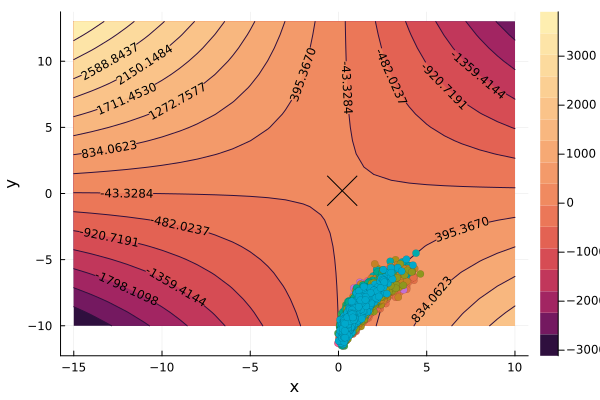

In [110]:
enLandIdx = 1
ep = 10
p = plot(-15:10, -10:13, (x,y)->f(x,y,enLandIdx, a0s[:,ep], b0s[:,ep], λs[:,ep]), st=:contourf, c=cgrad(:matter, 105, rev=true, scale = :exp, categorical=false), 
    xlabel="x", ylabel="y", clabels=true)
for num_label in string.(collect(0:9))
    plot!(x_s[num_label][enLandIdx,:,ep], y_s[num_label][enLandIdx,:,ep], st=:scatter, markerstrokewidth=0.1)
end
plot!([-b0s[enLandIdx,ep]/λs[enLandIdx,ep]],[-a0s[enLandIdx,ep]/λs[enLandIdx,ep]], ms=15, st=:scatter, c=:black, legend=:none, markershape=:x)

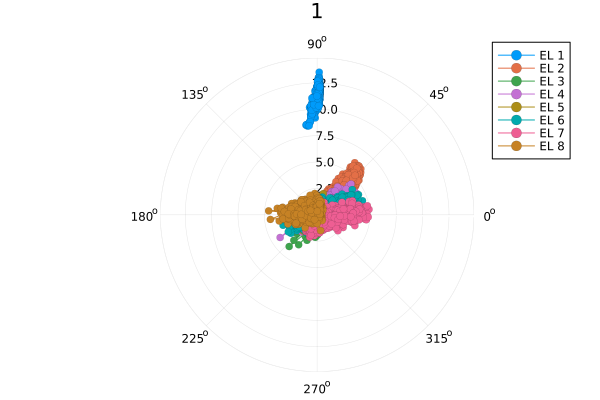

In [108]:
ep=1
plot()
for i in 1:8
    plot!(Θ["1"][i,:,ep], R["1"][i,:,ep], proj = :polar, m = 4, markerstrokewidth=0.1, title="1", label="EL $i")
end
plot!()

[ Info: Saved animation to /home/javier/Projects/RBM/Results/Figs/CD-500-T1000-5-BW-replica1-L/anim_1.gif


Plots.AnimatedGif("/home/javier/Projects/RBM/Results/Figs/CD-500-T1000-5-BW-replica1-L/anim_1.gif")
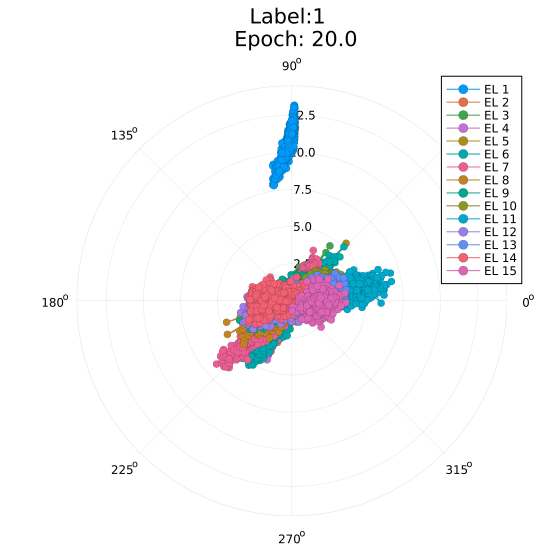

In [119]:
function genAnimation(x_s, y_s, R, Θ, s, modelname)
    for num_label in string.(collect(0:9))
        anim = @animate for ep ∈ 1:size(R[num_label],3)
            plot()
            for i in 1:15
                plot!(Θ[num_label][i,:,ep], R[num_label][i,:,ep], proj = :polar, m = 4, markerstrokewidth=0.1, 
                    title="Label:$(num_label) \n Epoch: $(ep*s/size(R[num_label],3))", label="EL $i")
            end
            plot!(size=(550,550))
        end
        gif(anim, "$(PATH)/Figs/$(modelname)/anim_polar_$(num_label).gif", fps = 1)
    end
    
    for enLand in 1:10
        anim = @animate for ep ∈ 1:size(x_s[num_label],3)
            p = plot(-15:10, -10:13, (x,y)->f(x,y,enLandIdx, a0s[:,ep], b0s[:,ep], λs[:,ep]), 
                st=:contourf, c=cgrad(:matter, 105, rev=true, scale = :exp, categorical=false), xlabel="x", ylabel="y", clabels=true)
            for num_label in string.(collect(0:9))
                plot!(x_s[num_label][enLandIdx,:,ep], y_s[num_label][enLandIdx,:,ep], st=:scatter, markerstrokewidth=0.1)
            end
            plot!([-b0s[enLandIdx,ep]/λs[enLandIdx,ep]],[-a0s[enLandIdx,ep]/λs[enLandIdx,ep]], ms=15, st=:scatter, c=:black, legend=:none, markershape=:x)
            plot!(size=(550,550))
        end
        gif(anim, "$(PATH)/Figs/$(modelname)/anim_LS_$(num_label).gif", fps = 1)
    end
end

In [42]:
jldsave("$(PATH)/Figs/$(modelname)/test.jld2", R=R, t=Θ)

In [80]:
tt = JLD2.load("$(PATH)Figs/CD-500-T1000-5-BW-replica5-L/landscapeParameters.jld")

Dict{String, Any} with 4 entries:
  "λs"  => [11.5993 14.4677 … 18.0566 18.0744; 4.85909 7.08165 … 16.8257 16.814…
  "sp"  => [0.100274 0.134839 … -2.29283 -2.32154; -0.000512403 0.000963986 … 0…
  "xsp" => [-0.123322 -0.130973 … 0.269462 0.273607; -0.00721976 0.00832592 … -…
  "ysp" => [-0.0700995 -0.0711598 … -0.471235 -0.469443; 0.0146061 0.0163495 … …

In [205]:

rbm.h = Array{Float32}(sign.(rand(hparams.nh, hparams.batch_size) |> dev .< σ.(β .* (J.w' * dev(rand(hparams.nv,hparams.batch_size)) .+ J.b)))) |> dev 
for i in 1:100
    # display(plotLandscapes(rbm, J, lnum ; τ=0, TS, dev, hparams))
    rbm.h = Array{Float32}(sign.(rand(hparams.nh, hparams.batch_size) |> dev .< σ.(β .* (J.w' * rbm.v .+ J.b)))) |> dev 
    rbm.v = Array{Float32}(sign.(rand(hparams.nv, hparams.batch_size) |> dev .< σ.(β .* (J.w * rbm.h .+ J.a)))) |> dev  
end

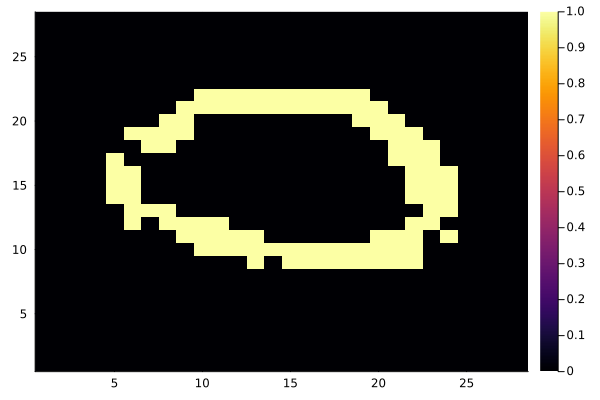

In [206]:
heatmap(reshape(cpu(rbm.v[:,1]),28,28))

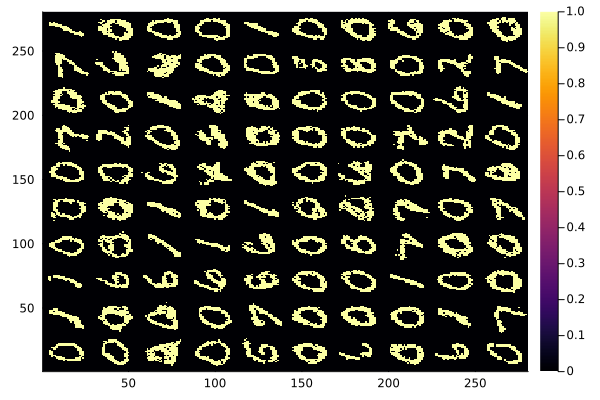

In [207]:
lnum=10
heatmap(cat([cat([reshape(cpu(rbm.v)[:,i+j*lnum],28,28) for i in 1:lnum]..., dims=2) for j in 0:lnum-1]...,dims=1))


In [108]:
PATH = "/home/javier/Projects/RBM/Results/"
l=100
nv=28*28
nh=500
for i in 1:5
    modelname = "CD-500-T1000-5-BW-replica$(i)-L"
    λs, a0s, b0s = loadLandscapes(PATH, modelname; l, nv, nh);
    sp = a0s[1:nh,:] .* b0s ./ λs;
    saveModePlot(λs, sp, a0s[1:nh,:], b0s)
end

In [101]:
PATH = "/home/javier/Projects/RBM/Results/"
modelname = "CD-500-T1000-5-BW-replica1-L"
l=100
λs, a0s, b0s = loadLandscapes(PATH, modelname);
sp = a0s[1:500,:] .* b0s ./ λs;
# saveModePlot(λs, sp, a0s, b0s)

# f = plot(xlabel="Epochs (x10)", ylabel="λ modes", frame=:box, legend=:none)
# L = 500
# for i in 1:L
#     f = plot!(λs[i,:], lw=2.5, c=RGB(i/L,0,1-i/L))
# end
# f = plot!(yscale=:log)


[ Info: 1
[ Info: 2
[ Info: 3
[ Info: 4
[ Info: 5
[ Info: 6
[ Info: 7
[ Info: 8
[ Info: 9
[ Info: 10
[ Info: 11
[ Info: 12
[ Info: 13
[ Info: 14
[ Info: 15
[ Info: 16
[ Info: 17
[ Info: 18
[ Info: 19
[ Info: 20
[ Info: 21
[ Info: 22
[ Info: 23
[ Info: 24
[ Info: 25
[ Info: 26
[ Info: 27
[ Info: 28
[ Info: 29
[ Info: 30
[ Info: 31
[ Info: 32
[ Info: 33
[ Info: 34
[ Info: 35
[ Info: 36
[ Info: 37
[ Info: 38
[ Info: 39
[ Info: 40
[ Info: 41
[ Info: 42
[ Info: 43
[ Info: 44
[ Info: 45
[ Info: 46
[ Info: 47
[ Info: 48
[ Info: 49
[ Info: 50
[ Info: 51
[ Info: 52
[ Info: 53
[ Info: 54
[ Info: 55
[ Info: 56
[ Info: 57
[ Info: 58
[ Info: 59
[ Info: 60
[ Info: 61
[ Info: 62
[ Info: 63
[ Info: 64
[ Info: 65
[ Info: 66
[ Info: 67
[ Info: 68
[ Info: 69
[ Info: 70
[ Info: 71
[ Info: 72
[ Info: 73
[ Info: 74
[ Info: 75
[ Info: 76
[ Info: 77
[ Info: 78
[ Info: 79
[ Info: 80
[ Info: 81
[ Info: 82
[ Info: 83
[ Info: 84
[ Info: 85
[ Info: 86
[ Info: 87
[ Info: 88
[ Info: 89
[ Info: 90
[ Info: 91
[ Info: 

LoadError: DimensionMismatch: arrays could not be broadcast to a common size; got a dimension with lengths 784 and 500

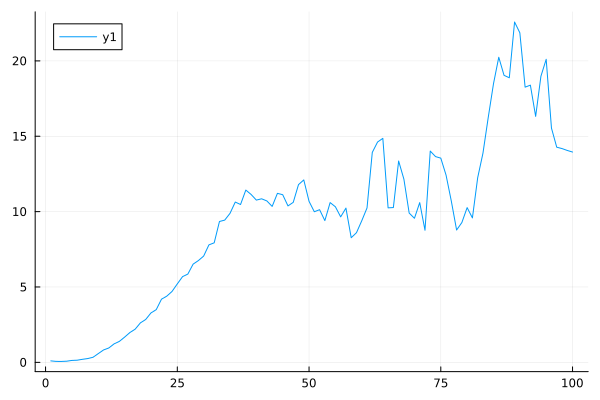

In [113]:
# sp = a0s[1:500,:] .* b0s ./ λs;
plot(reshape(sum(sp, dims=1),:))

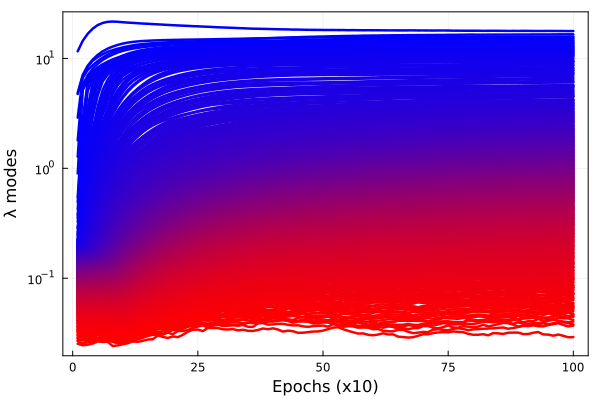

In [95]:
plot(xlabel="Epochs (x10)", ylabel="λ modes", frame=:box, legend=:none)
L = 500
for i in 1:L
    plot!(λs[i,:], lw=2.5, c=RGB(i/L,0,1-i/L))
end
plot!(yscale=:log)

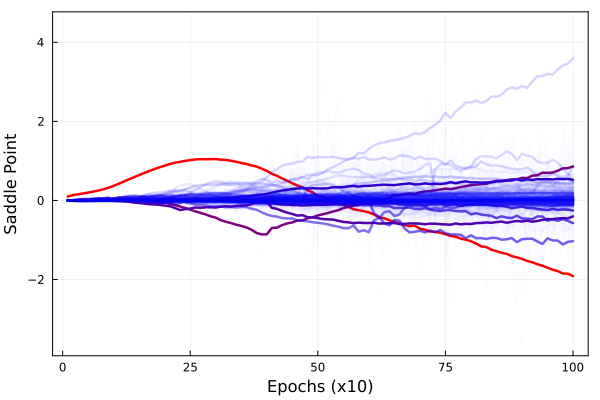

In [94]:
plot(xlabel="Epochs (x10)", ylabel="Saddle Point", frame=:box, legend=:none)
for i in 1:L
    plot!(sp[i,:], lw=2.5, c=RGB(1/i,0,1-1/i), opacity=1/(0.2*i))
end
plot!()